In [ ]:
!pip install -q --upgrade keras-cv
!pip install -q --upgrade keras  # Upgrade to Keras 3.
# !pip install tensorflow

In [2]:
import time
import keras_cv
import keras
import matplotlib.pyplot as plt

In [3]:
model = keras_cv.models.StableDiffusion(
    img_width=512, img_height=512, jit_compile=False
)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


1356917/1356917 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
492466864/492466864 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
3439090152/3439090152 ━━━━━━━━━━━━━━━━━━━━ 24s 0us/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 185s 2s/step
198180272/198180272 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
CPU times: user 4min 6s, sys: 16 s, total: 4min 22s
Wall time: 4min 50s


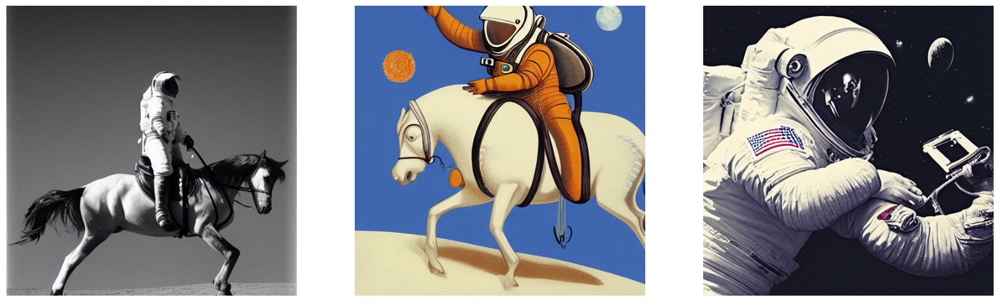

In [4]:
%%time
images = model.text_to_image("photograph of an astronaut riding a horse", batch_size=3)


def plot_images(images):
    plt.figure(figsize=(20, 20))
    for i in range(len(images)):
        ax = plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.axis("off")


plot_images(images)

In [ ]:
# save images from images
for i, img in enumerate(images):
    keras.preprocessing.image.save_img(f"image_{i}.png", img)

50/50 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step
CPU times: user 2min 24s, sys: 1.49 s, total: 2min 25s
Wall time: 2min 36s


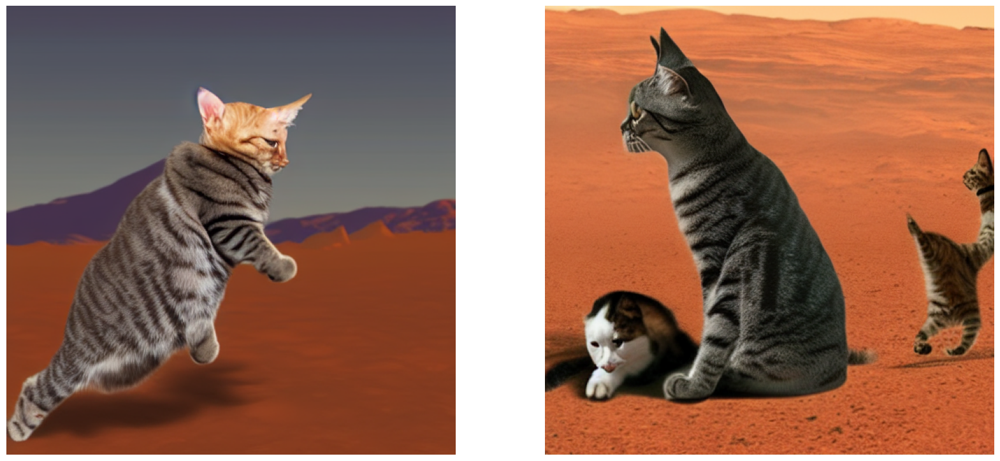

In [ ]:
%%time
images = model.text_to_image("Create an image of cat playing with dog on mars", batch_size=2)
def plot_images(images):
    plt.figure(figsize=(20, 20))
    for i in range(len(images)):
        ax = plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.axis("off")
plot_images(images)

50/50 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step
CPU times: user 1min 25s, sys: 137 ms, total: 1min 26s
Wall time: 1min 26s


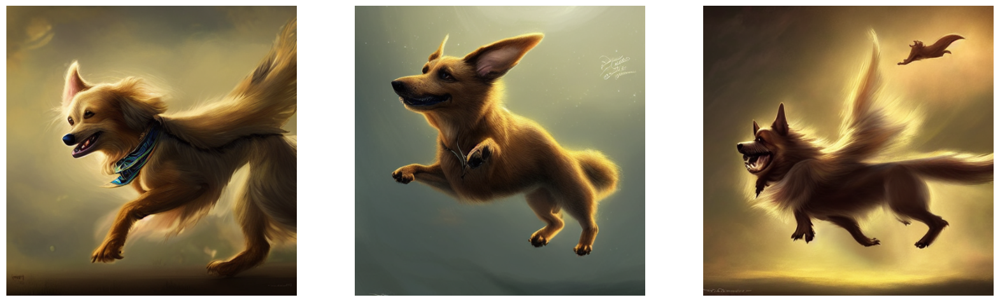

In [ ]:
%%time
images = model.text_to_image(
    "cute magical flying dog, fantasy art, "
    "golden color, high quality, highly detailed, elegant, sharp focus, "
    "concept art, character concepts, digital painting, mystery, adventure",
    batch_size=3,
)
plot_images(images)

50/50 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step
Standard model: 86.31 seconds


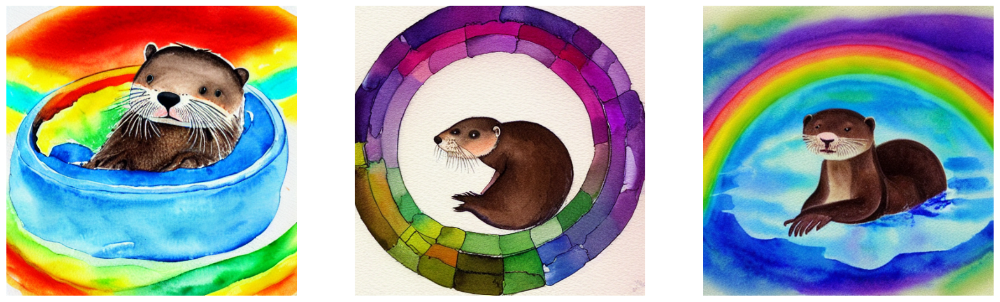

In [ ]:
%%time
benchmark_result = []
start = time.time()
images = model.text_to_image(
    "A cute otter in a rainbow whirlpool holding shells, watercolor",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["Standard", end - start])
plot_images(images)

print(f"Standard model: {(end - start):.2f} seconds")
keras.backend.clear_session()  # Clear session to preserve memory.

In [ ]:
model = keras_cv.models.StableDiffusion(jit_compile=False)

print("Compute dtype:", model.diffusion_model.compute_dtype)
print(
    "Variable dtype:",
    model.diffusion_model.variable_dtype,
)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
Compute dtype: float32
Variable dtype: float32


50/50 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step
Mixed precision model: 86.15 seconds


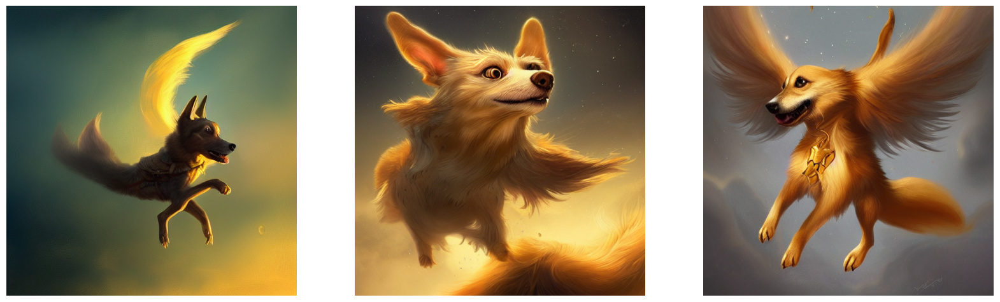

In [ ]:
# Warm up model to run graph tracing before benchmarking.
model.text_to_image("warming up the model", batch_size=3)

start = time.time()
images = model.text_to_image(
    "a cute magical flying dog, fantasy art, "
    "golden color, high quality, highly detailed, elegant, sharp focus, "
    "concept art, character concepts, digital painting, mystery, adventure",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["Mixed Precision", end - start])
plot_images(images)

print(f"Mixed precision model: {(end - start):.2f} seconds")
keras.backend.clear_session()

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


50/50 ━━━━━━━━━━━━━━━━━━━━ 94s 613ms/step
CPU times: user 2min 9s, sys: 6.88 s, total: 2min 16s
Wall time: 2min 19s


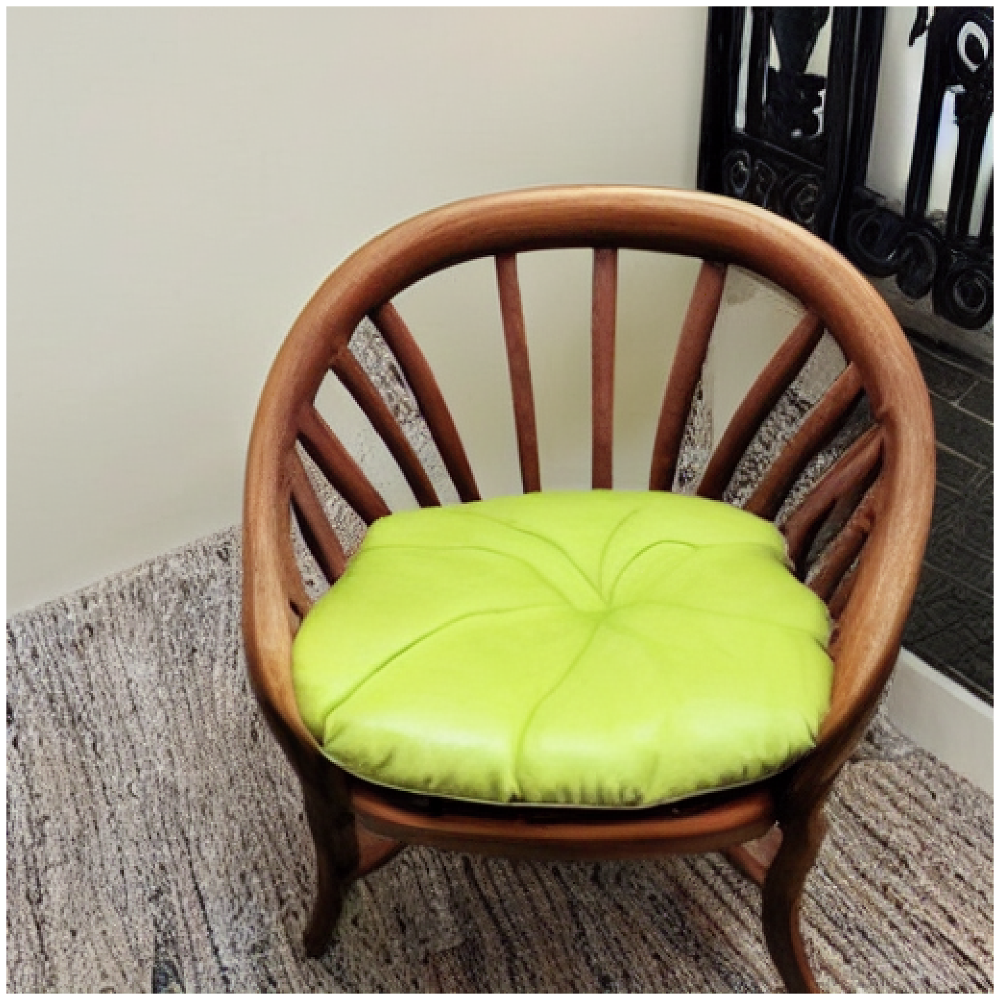

In [ ]:
%%time
# Set back to the default for benchmarking purposes.
keras.mixed_precision.set_global_policy("float32")

model = keras_cv.models.StableDiffusion(jit_compile=True)
# Before we benchmark the model, we run inference once to make sure the TensorFlow
# graph has already been traced.
# Reduced the batch_size to 1 to potentially reduce memory usage during the warm-up step.
images = model.text_to_image("An avocado armchair", batch_size=1)
plot_images(images)

50/50 ━━━━━━━━━━━━━━━━━━━━ 31s 621ms/step
Standard model: 31.61 seconds


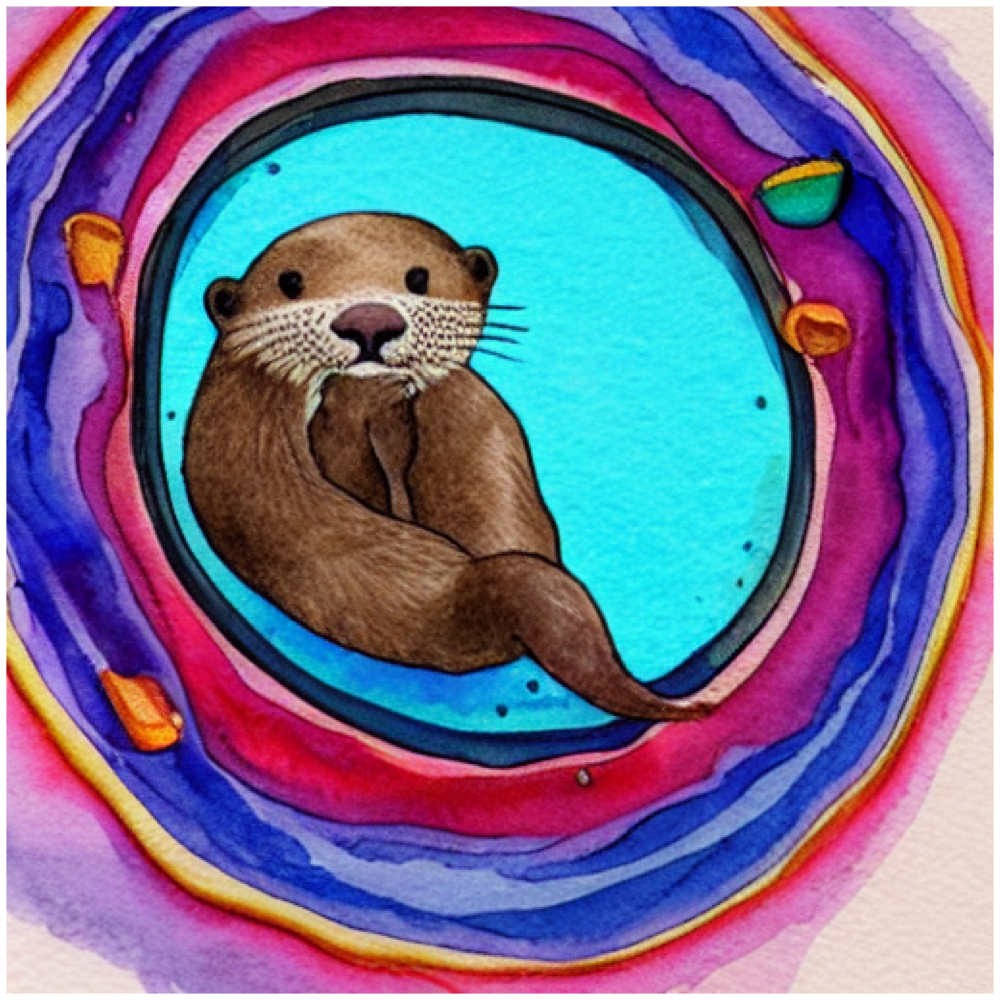

In [ ]:
%%time
# Initialize the benchmark_result list
benchmark_result = []

# %%time
# The rest of your code that appends to benchmark_result can follow in subsequent cells.
# For example, the content of the first failed cell:
start = time.time()
images = model.text_to_image(
    "A cute otter in a rainbow whirlpool holding shells, watercolor",
    batch_size=1, # Reduced batch size to reduce memory usage
)
end = time.time()
benchmark_result.append(["Standard", end - start])
plot_images(images)

print(f"Standard model: {(end - start):.2f} seconds")
keras.backend.clear_session()  # Clear session to preserve memory.

In [5]:
keras.mixed_precision.set_global_policy("mixed_float16")
model = keras_cv.models.StableDiffusion(jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


50/50 ━━━━━━━━━━━━━━━━━━━━ 101s 576ms/step


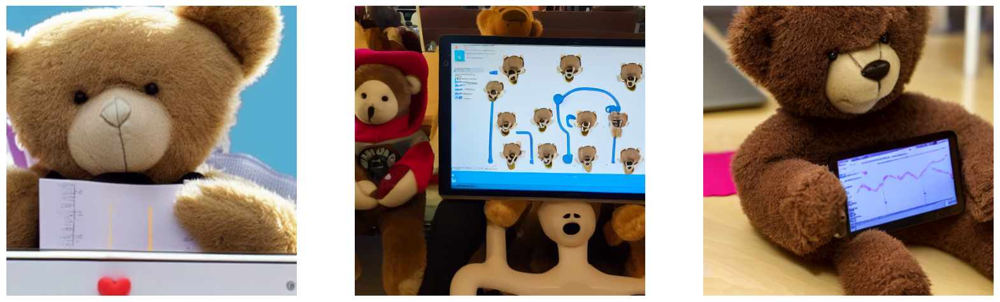

In [7]:
%%time
# Let's make sure to warm up the model
images = model.text_to_image(
    "Teddy bears conducting machine learning research",
    batch_size=3,
)
plot_images(images)

50/50 ━━━━━━━━━━━━━━━━━━━━ 29s 574ms/step
XLA + mixed precision: 29.26 seconds
CPU times: user 29.2 s, sys: 76.9 ms, total: 29.2 s
Wall time: 29.3 s


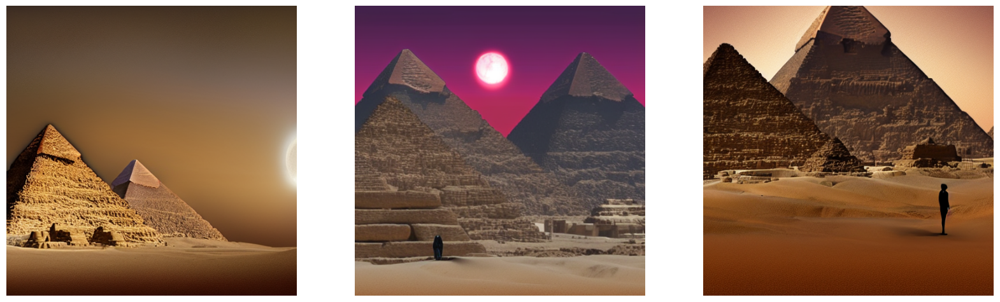

In [9]:
%%time
# Initialize the benchmark_result list
benchmark_result = []
start = time.time()
images = model.text_to_image(
    "A mysterious dark stranger visits the great pyramids of egypt, "
    "high quality, highly detailed, elegant, sharp focus, "
    "concept art, character concepts, digital painting",
    batch_size=3,
)
end = time.time()
benchmark_result.append(["XLA + Mixed Precision", end - start])
plot_images(images)

print(f"XLA + mixed precision: {(end - start):.2f} seconds")

In [10]:
print("{:<22} {:<22}".format("Model", "Runtime"))
for result in benchmark_result:
    name, runtime = result
    print("{:<22} {:<22}".format(name, runtime))

Model                  Runtime               
XLA + Mixed Precision  29.262030839920044    


-----------------